Load the picture of Politecnico’s facade ``polimi_compressed.jpg``:

In [120]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread

In [121]:
image_path = "polimi_compress.jpg"
img = imread(image_path)
print(img.shape)

(375, 800, 3)


In [122]:
img_RGB = [np.array(img[:, :, i], dtype=np.float64) / 255 for i in range(3)]

Please notice that the RGB object is list of three matrices, each one corresponding to a different ”channel” (i.e. red, greed, or blue).

In [183]:
def plot_image(RGB, ax=None):
    if ax is None:
        _, ax = plt.subplots(1, 1, figsize=(12, 5))
    ax.imshow(np.clip(np.stack(RGB, axis=2), 0, 1))
    ax.axis("off")

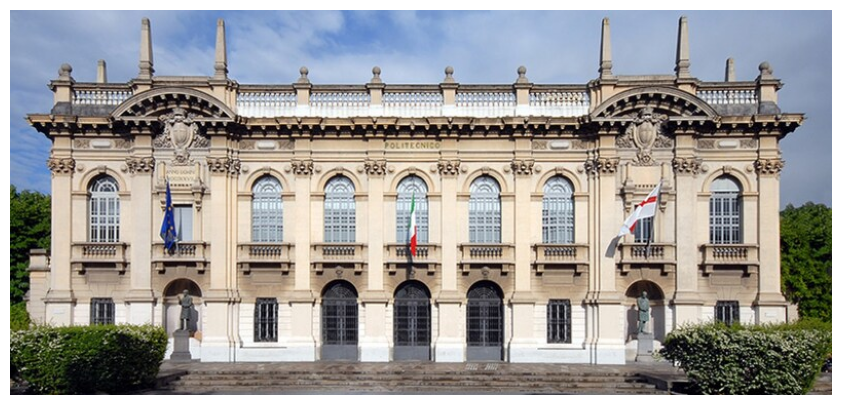

In [124]:
plot_image(img_RGB)

Now, randomly replace 70% of the pixels with random colors:

In [125]:
damage_fraction = 0.7
np.random.seed(0)
mask_remove = np.random.choice(
    a=[True, False],
    size=(img.shape[0], img.shape[1]),
    p=[damage_fraction, 1 - damage_fraction],
)
mask_keep = np.logical_not(mask_remove)
img_damaged_RGB = [img_RGB[i].copy() for i in range(3)]
for i in range(3):
    img_damaged_RGB[i][mask_remove] = np.random.rand(np.sum(mask_remove))

1. Display the damaged image.

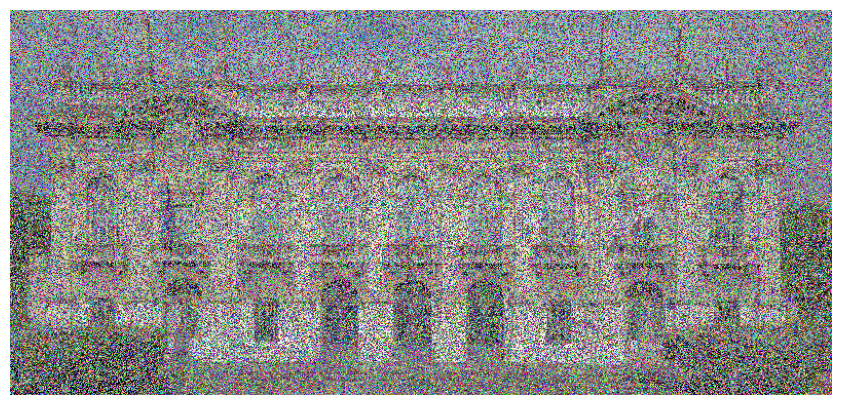

In [126]:
plot_image(img_damaged_RGB)

2. Implement the singular value truncation (SVT) algorithm to reconstruct the picture from img damaged RGB.

    (Hint: apply the algorithm independently to each channel.)

In [199]:
def SVT(img_ch, s_thresh):
    max_iter = 200
    tol = 1.0e-6

    img = img_ch.copy()
    for k in range(max_iter):
        img_old = img.copy()
        U, s, VT = np.linalg.svd(img, full_matrices=False)
        s[s < s_thresh] = 0
        img = U @ np.diag(s) @ VT
        img[mask_keep] = img_ch[mask_keep]

        incr = np.linalg.norm(img - img_old)
        if incr < tol:
            print("Tolerance achieved!")
            break

    print("n_iter: %d" % k)
    return img

In [200]:
thresholds = [2, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
reconstructed_imgs = list()
RMSE_thresh = list()

for s_thresh in thresholds:
    print("Current threshold: %d" % s_thresh)
    img_reconstructed = img_damaged_RGB.copy()
    RMSE = 0.0
    for i in range(3):
        img_reconstructed[i] = SVT(img_damaged_RGB[i], s_thresh)
        RMSE += np.sqrt(np.mean((img_reconstructed[i] - img_RGB[i]) ** 2))

    reconstructed_imgs.append(img_reconstructed)
    RMSE_thresh.append(RMSE)

Current threshold: 2
Tolerance achieved!
n_iter: 0
Tolerance achieved!
n_iter: 0
Tolerance achieved!
n_iter: 0
Current threshold: 5
Tolerance achieved!
n_iter: 47
Tolerance achieved!
n_iter: 46
Tolerance achieved!
n_iter: 46
Current threshold: 7
n_iter: 199
n_iter: 199
Tolerance achieved!
n_iter: 169
Current threshold: 8
n_iter: 199
n_iter: 199
n_iter: 199
Current threshold: 9
n_iter: 199
n_iter: 199
n_iter: 199
Current threshold: 10
n_iter: 199
n_iter: 199
n_iter: 199
Current threshold: 11
n_iter: 199
n_iter: 199
n_iter: 199
Current threshold: 12
n_iter: 199
n_iter: 199
n_iter: 199
Current threshold: 13
n_iter: 199
Tolerance achieved!
n_iter: 183
Tolerance achieved!
n_iter: 154
Current threshold: 14
Tolerance achieved!
n_iter: 155
Tolerance achieved!
n_iter: 162
Tolerance achieved!
n_iter: 170
Current threshold: 15
Tolerance achieved!
n_iter: 155
Tolerance achieved!
n_iter: 192
Tolerance achieved!
n_iter: 158
Current threshold: 16
Tolerance achieved!
n_iter: 163
Tolerance achieved!
n_

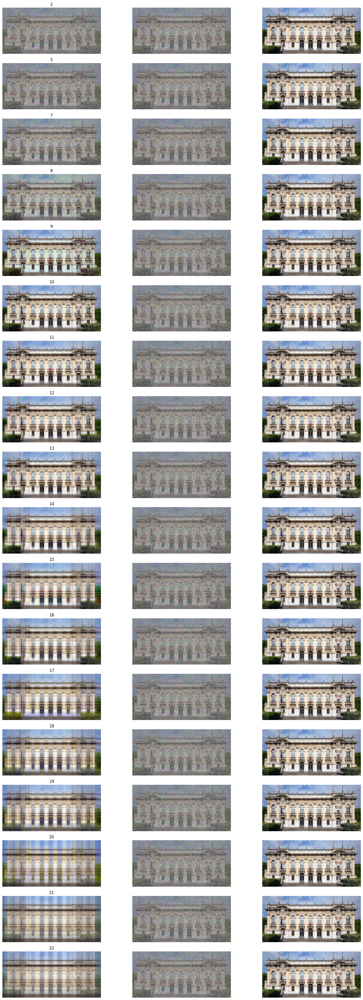

In [201]:
n_images = len(reconstructed_imgs)
fig, axs = plt.subplots(nrows=n_images, ncols=3, figsize=(20, 3 * n_images))
axs = axs.flatten()
for i in range(n_images):
    plot_image(reconstructed_imgs[i], axs[3 * i])
    axs[3 * i].set_title(thresholds[i])
    plot_image(img_damaged_RGB, axs[3 * i + 1])
    plot_image(img_RGB, axs[3 * i + 2])

8.052446169318483


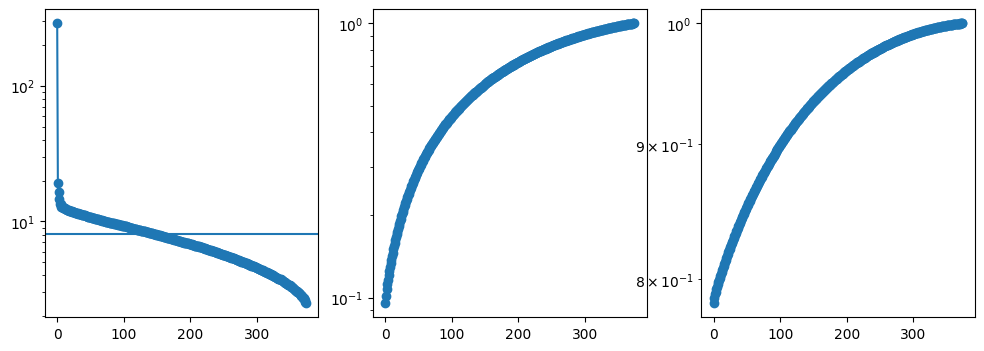

In [203]:
img = img_damaged_RGB[1]
U, s, VT = np.linalg.svd(img)

fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].semilogy(s, "o-")
axs[0].axhline(np.mean(s))
print(np.mean(s))
axs[1].semilogy(np.cumsum(s) / np.sum(s), "o-")
axs[2].semilogy(np.cumsum(s**2) / np.sum(s**2), "o-")